In [29]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


/home/fl350/.pyenv/versions/2.7.11/envs/jupyter/lib/python2.7/site-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['text', 'repeat', 'bar', 'test']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [26]:
from music21 import *
import seaborn as sns
import pandas as pd
from matplotlib import gridspec
import h5py
import json

import sys
sys.path.append('/home/fl350/bachbot/scripts')
from constants import *

In [27]:
utf_to_txt = json.load(open('/home/fl350/bachbot/scratch/utf_to_txt.json'))
txt_to_utf = { v:k for k,v in utf_to_txt.items() }

checkpoint_fp = '/home/fl350/bachbot/best_model/checkpoint_200'
params = json.load(open(checkpoint_fp + '.json', 'r'))
vocabs = json.load(open(params['opt']['input_json'], 'r'))
vocab_size = len(vocabs['token_to_idx'])

In [19]:
fp = '/home/fl350/data/embed/input.h5'
input_data = h5py.File(fp)[fp].value.T
is_chord_bdy = input_data ==  vocabs['token_to_idx'][txt_to_utf[CHORD_BOUNDARY_DELIM]]

In [20]:
def pool_chords(ds, is_chord_bdy, softmax_before_pool=False, temperature=1.0):
    """
    Computes token probabilities and pools across chords. Useful for making dim 2 correspond to time.
    """
    pooled_probs = np.zeros((ds.shape[0], is_chord_bdy.sum()+1))
    curr_chord_idx = 0
    for i in range(is_chord_bdy.size):
        if softmax_before_pool:
            pooled_probs[:,curr_chord_idx] += (np.exp(ds[:,i] / temperature) / sum(np.exp(ds[:,i] / temperature)))
        else:
            pooled_probs[:,curr_chord_idx] += ds[:,i]
        if is_chord_bdy[i,0]:
            curr_chord_idx += 1            
    return pooled_probs

In [21]:
def pool_matrix(mat, row_to_bin):
    "Pools the rows of `mat` using row_to_order"
    pooled = np.zeros((len(set(row_to_bin.values())), mat.shape[1]))
    for row_idx in range(mat.shape[0]):
        pooled[row_to_bin[row_idx],:] += mat[row_idx,:]
    return pooled

In [22]:
special_texts = [CHORD_BOUNDARY_DELIM, FERMATA_SYM, 'START', 'END']

txt_to_idx = dict(map(lambda x: (utf_to_txt[x[0]], x[1]), vocabs['token_to_idx'].items()))
idx_to_txt = { v:k for k,v in txt_to_idx.items() }
note_txt_to_idx = dict(filter(lambda x: x[0] not in special_texts, txt_to_idx.items()))

# mapping from idx in vocabulary (1-based) to sorted order index (for drawing piano roll)
# NOTE: caller usually needs to convert idx to be 0-based 
idx_to_order = dict()
curr_idx = 0
prev_midi = None
for note_txt, idx in sorted(note_txt_to_idx.items(), key=lambda x: eval(x[0])[0]): # sorted by pitch
    curr_midi = eval(note_txt)[0]
    #print prev_midi, curr_midi, (note_txt, curr_idx), 
    if prev_midi and curr_midi > prev_midi: # this collapses articulated and unarticulated version 
        curr_idx += 1
    idx_to_order[idx] = curr_idx
    prev_midi = curr_midi
for txt in special_texts:
    curr_idx += 1
    idx_to_order[vocabs['token_to_idx'][txt_to_utf[txt]]] = curr_idx
    
assert set(range(1,vocab_size+1)) == set(idx_to_order)
assert set(idx_to_order.values()) == set(range(len(set(idx_to_order.values()))))

txt_to_order = {utf_to_txt[tok]:idx_to_order[vocabs['token_to_idx'][tok]] for tok in vocabs['token_to_idx']}

In [23]:
# mapping from `order_idx` (i.e. row in piano roll) back to raw text, used for ylabels in piano roll
order_to_txt = {}
for idx, order in idx_to_order.items():
    txt = idx_to_txt[idx]
    if txt in special_texts:
        order_to_txt[order] = txt
    else:
        midiPitch = int(txt.split(',')[0][1:])
        n = note.Note()
        n.pitch.midi = midiPitch
        order_to_txt[order] = n.nameWithOctave

In [57]:
def plot_piano_roll(ax1, s):
    g = graph.PlotHorizontalBarPitchSpaceOffset(s)
    data, xTicks, _ = g._extractData()

    yPos = 0
    xPoints = [] # store all to find min/max
    yTicks = [] # a list of label, value pairs

    #colors = sns.color_palette("muted")
    colors = sns.color_palette("husl", 12)

    keys = []
    i = 0
    for i, (key, points) in enumerate(data):
        keys.append(key)
        if len(points) > 0:
            yrange = (yPos + 1, 1)
            ax1.broken_barh(points,
                            yrange,
                            facecolor=colors[i%len(colors)],
                            alpha=0.8)
            for xStart, xLen in points:
                xEnd = xStart + xLen
                for x in [xStart, xEnd]:
                    if x not in xPoints:
                        xPoints.append(x)
        yTicks.append([yPos + 1 * .5, key])
        yPos += 1
        i += 1

    xMin = min(xPoints)
    xMax = max(xPoints) 
    ax1.set_ylim(0, len(keys) * 1)
    ax1.set_xlim(xMin, xMax)
    ax1.set_yticks(map(lambda x: x+1, zip(*yTicks)[0]))
    ax1.set_yticklabels(zip(*yTicks)[1])
    ax1.set_xticks(zip(*xTicks)[0])
    ax1.set_xticklabels(zip(*xTicks)[1])
    ax1.set_title('Piano roll')
    ax1.set_xlabel('Measure number')
    ax1.set_ylabel('Pitch')
    return ax1

### The test score used as network input

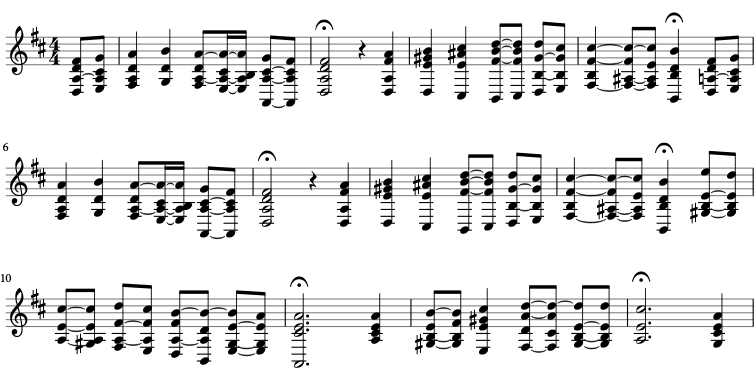

In [53]:
corpus.parse("bach","bwv133.6").chordify().write('musicxml', '/home/fl350/data/embed/input.xml')
corpus.parse("bach","bwv133.6").chordify().show()

In [113]:
sRoman = s.chordify().flat
for c in sRoman.notes:
    c.lyric =  roman.romanNumeralFromChord(c, key.Key('C')).romanNumeral
sRoman.write('musicxml','input-roman.xml')

'input-roman.xml'

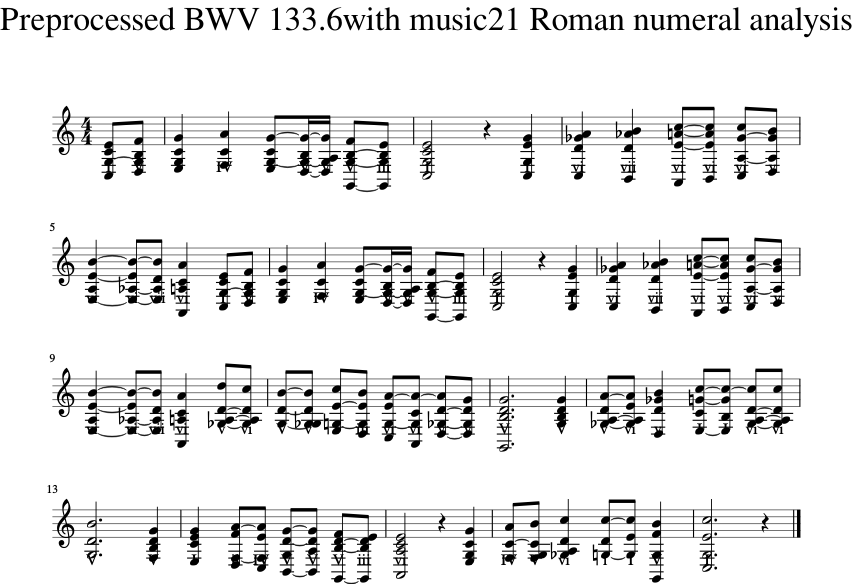

In [115]:
s = converter.parseFile('/home/fl350/data/embed/input-roman.xml')
#s.write('musicxml.png', 'model-analysis-input-score-roman.xml')
s.show()

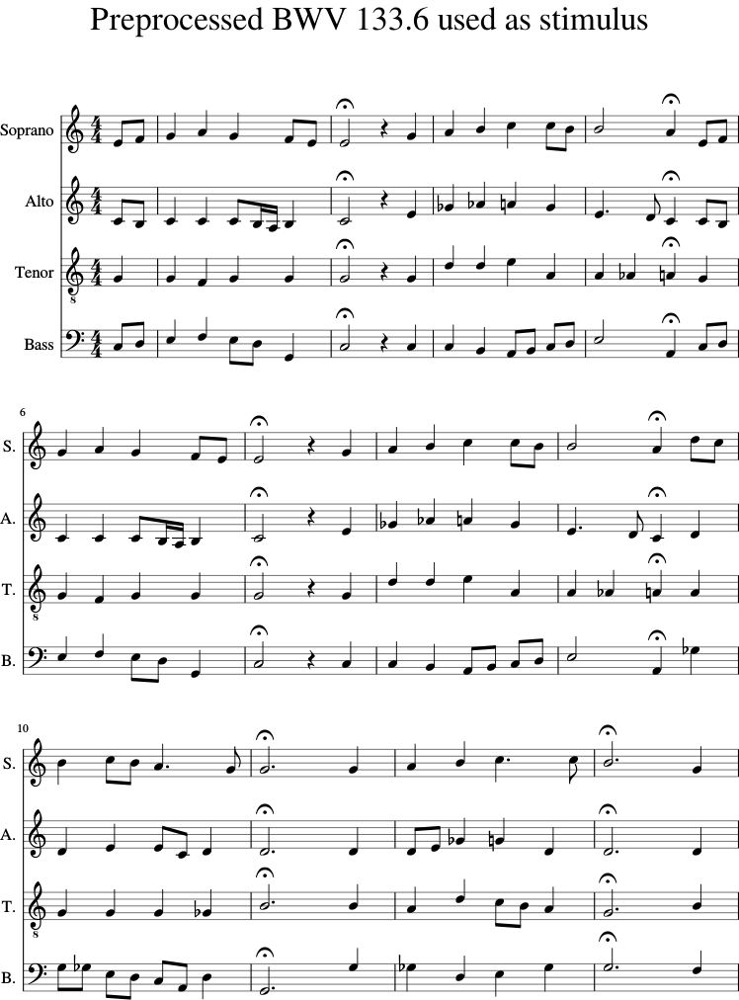

In [116]:
s = converter.parseFile('/home/fl350/data/embed/input-full.xml')
#s.write('musicxml.pdf', 'model-analysis-input-score-full.xml')
s.show()

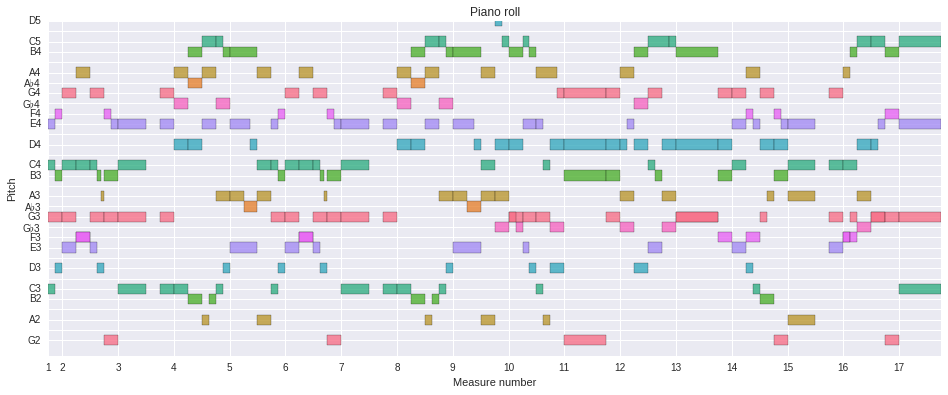

In [91]:
with sns.axes_style("darkgrid"):
    fig, ax1 = plt.subplots(1,1)

plot_piano_roll(ax1, s)
    
fig.set_size_inches((16,6))
fig.show()
fig.savefig('model-analysis-input-piano-roll.png')

### Activations/Cell state visualizations

In [370]:
layerString="""
  (1): nn.LookupTable
  (2): nn.LSTM(32 -> 256)
  (3): nn.View(6400, -1)
  (4): nn.BatchNormalization
  (5): nn.View(50, 128, -1)
  (6): nn.Dropout(0.300000)
  (7): nn.LSTM(256 -> 256)
  (8): nn.View(6400, -1)
  (9): nn.BatchNormalization
  (10): nn.View(50, 128, -1)
  (11): nn.Dropout(0.300000)
  (12): nn.LSTM(256 -> 256)
  (13): nn.View(6400, -1)
  (14): nn.BatchNormalization
  (15): nn.View(50, 128, -1)
  (16): nn.Dropout(0.300000)
  (17): nn.View(6400, -1)
  (18): nn.Linear(256 -> 108)
  (19): nn.View(50, 128, -1)
""".strip()

layerNumToName = dict()
for st in layerString.split('\n'):
    parts = st.split(':')
    layerNum = int(parts[0].strip()[1:-1])
    layerName = parts[1][3:]
    layerNumToName[layerNum] = layerName

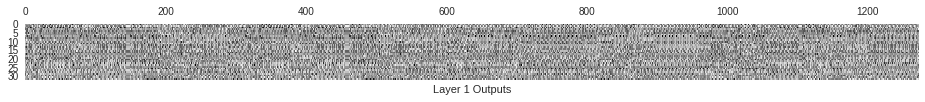

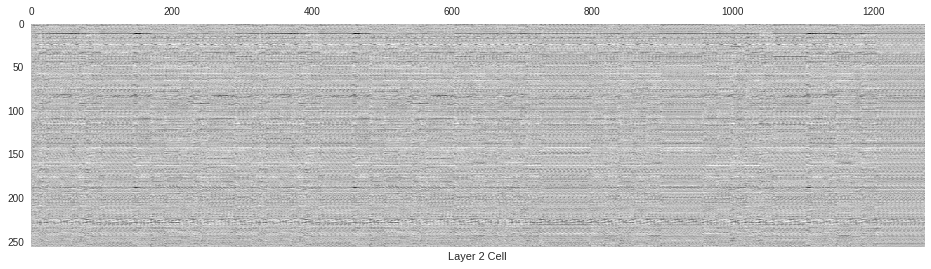

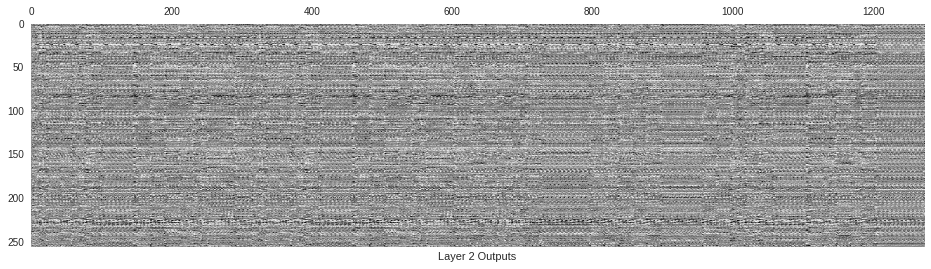

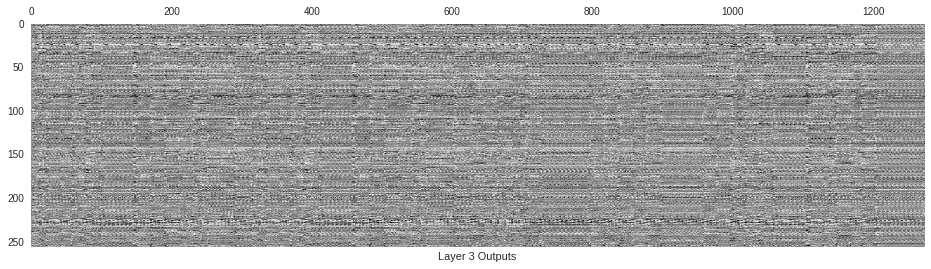

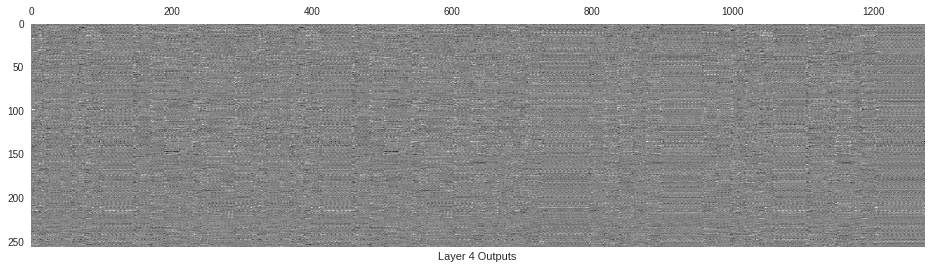

...

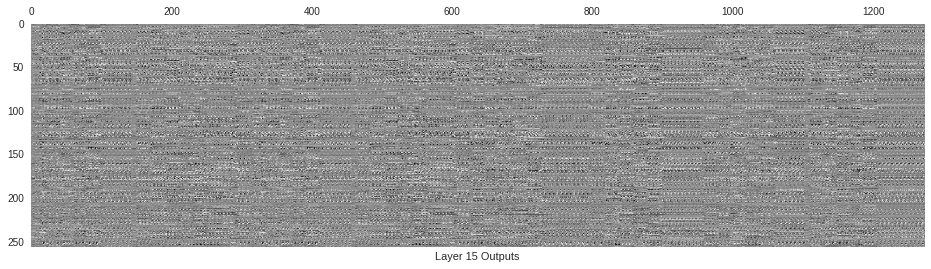

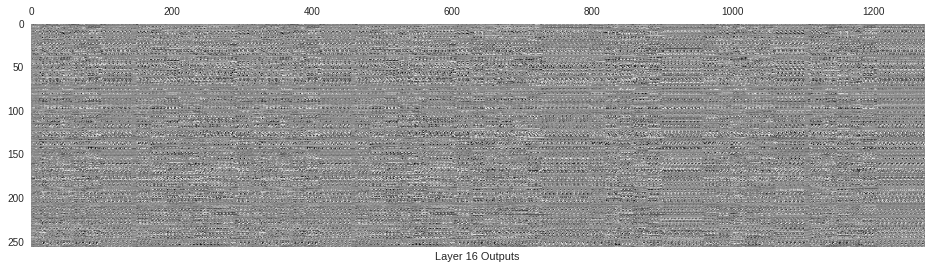

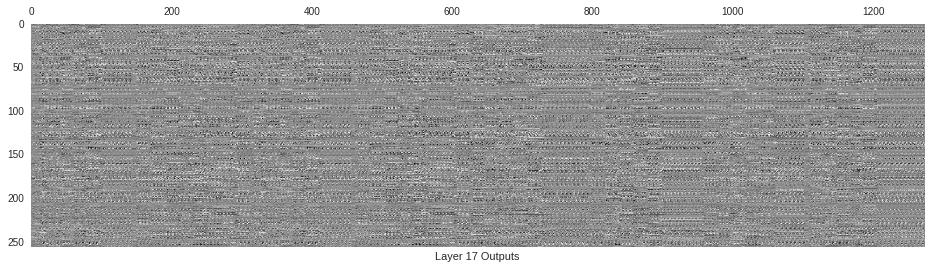

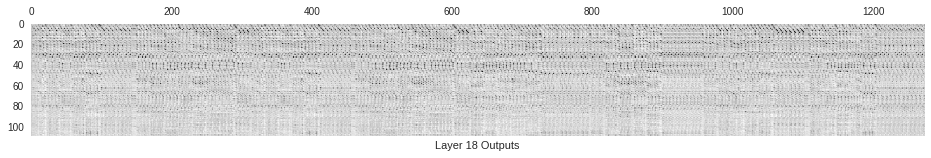

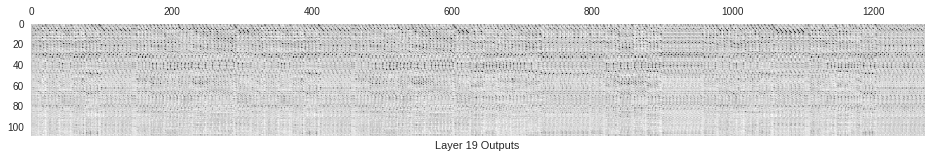

In [364]:
num_layers = len(layerNumToName)

for layer in range(1,num_layers+1):
    fp = '/home/fl350/data/embed/outputs-{}.h5'.format(layer)
    
    cell_fp = os.path.dirname(fp) + '/cell-{}.h5'.format(layer)
    if os.path.exists(cell_fp):
        ds = h5py.File(cell_fp)[cell_fp].value.T
        with sns.axes_style('dark'):
            plt.figure(num=1, figsize=(16,np.ceil(ds.shape[0] * 4. / 300.)))
            plt.matshow(ds, fignum=1, aspect='auto')
            plt.xlabel('Layer {} Cell'.format(layer))
            plt.show()

    ds = h5py.File(fp)[fp].value.T
    with sns.axes_style('dark'):
        plt.figure(num=1, figsize=(16,np.ceil(ds.shape[0] * 4. / 300.)))
        plt.matshow(ds, fignum=1, aspect='auto')
        plt.xlabel('Layer {} Outputs'.format(layer))
        plt.show()        

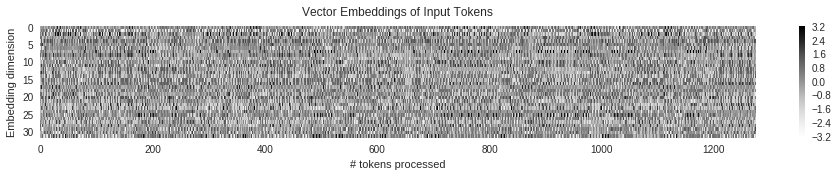

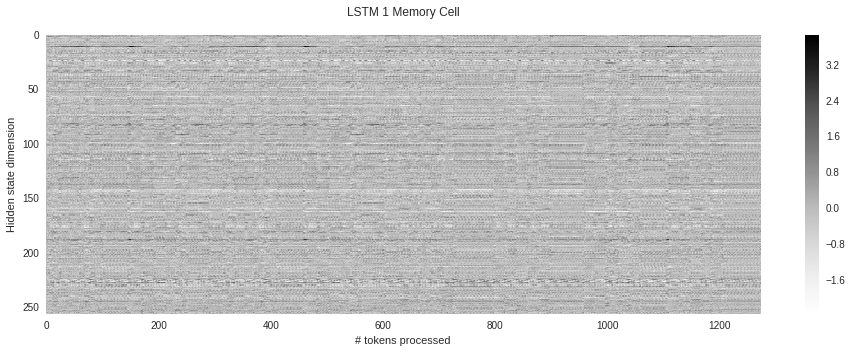

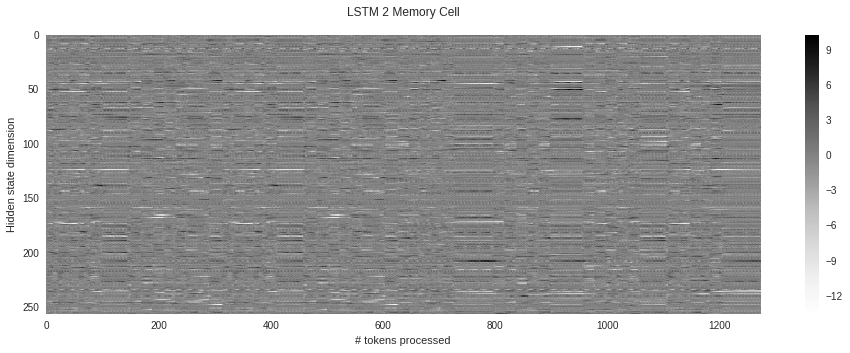

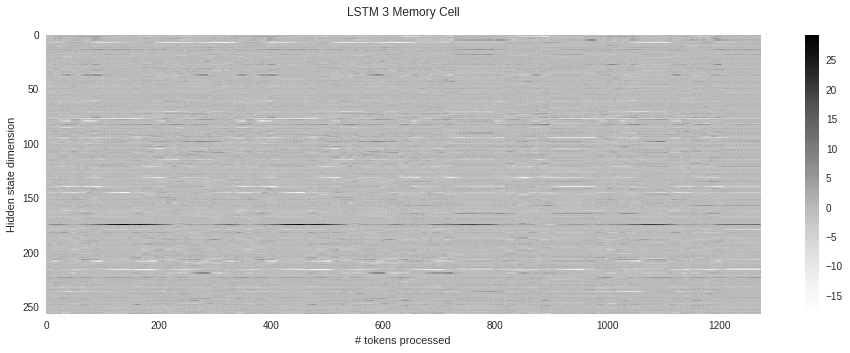

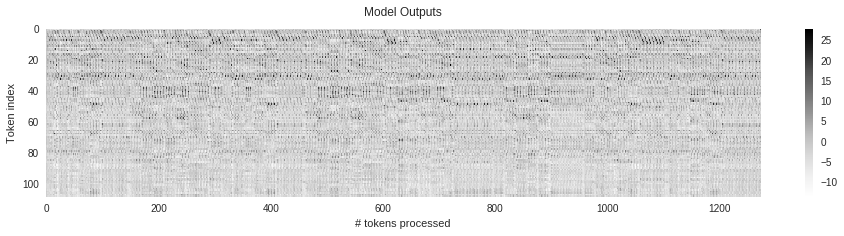

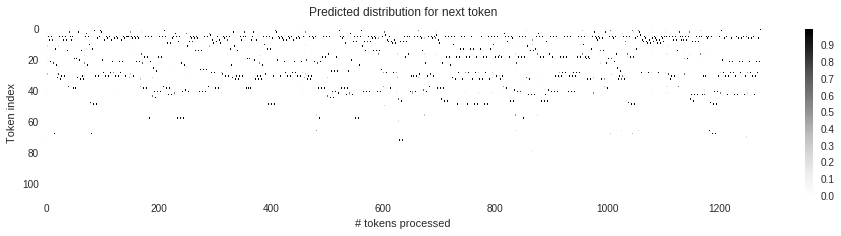

In [366]:
num_layers = len(layerNumToName)
lstm_cnt = 0
figure_cnt = 0
for layer in range(1,num_layers+1):
    fp = '/home/fl350/data/embed/outputs-{}.h5'.format(layer)
    
    cell_fp = os.path.dirname(fp) + '/cell-{}.h5'.format(layer)
    if os.path.exists(cell_fp):
        ds = h5py.File(cell_fp)[cell_fp].value.T
        lstm_cnt += 1
        with sns.axes_style('dark'):
            plt.figure(num=1, figsize=(16,1+np.ceil(ds.shape[0] * 4. / 300.)))
            plt.matshow(ds, fignum=1, aspect='auto')
            plt.gca().xaxis.set_ticks_position('bottom')
            plt.title('LSTM {} Memory Cell'.format(lstm_cnt))
            plt.xlabel('# tokens processed')
            plt.ylabel('Hidden state dimension')
            plt.colorbar()
            plt.subplots_adjust(bottom=0.15)
            plt.savefig('model-analysis-tokens-{}.png'.format(figure_cnt))
            figure_cnt += 1
            plt.show()
    if layer in [1, 19]:
        ds = h5py.File(fp)[fp].value.T
        with sns.axes_style('dark'):
            plt.figure(num=1, figsize=(16,1+np.ceil(ds.shape[0] * 4. / 300.)))
            plt.matshow(ds, fignum=1, aspect='auto')
            plt.gca().xaxis.set_ticks_position('bottom')
            if layer == 1:
                plt.title('Vector Embeddings of Input Tokens')
                plt.ylabel('Embedding dimension')
            elif layer == 19:
                plt.title('Model Outputs')
                plt.ylabel('Token index')
            plt.xlabel('# tokens processed')
            plt.colorbar()
            plt.subplots_adjust(bottom=0.15)
            plt.savefig('model-analysis-tokens-{}.png'.format(figure_cnt))
            figure_cnt += 1
            plt.show()
            
            if layer == 19:
                plt.figure(num=1, figsize=(16,1+np.ceil(ds.shape[0] * 4. / 300.)))
                plt.matshow(np.exp(ds) / np.sum(np.exp(ds), 0), fignum=1, aspect='auto')
                plt.gca().xaxis.set_ticks_position('bottom')
                plt.title('Predicted distribution for next token')
                plt.xlabel('# tokens processed')
                plt.ylabel('Token index')
                plt.colorbar()
                plt.subplots_adjust(bottom=0.15)
                plt.savefig('model-analysis-tokens-{}.png'.format(figure_cnt))
                figure_cnt += 1
                plt.show()
            

### Pooled over frames (i.e. one step in x-axis corresponds to 1/16th note)

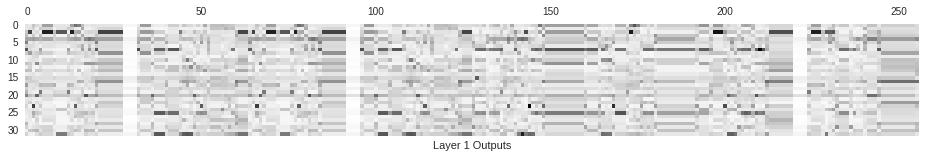

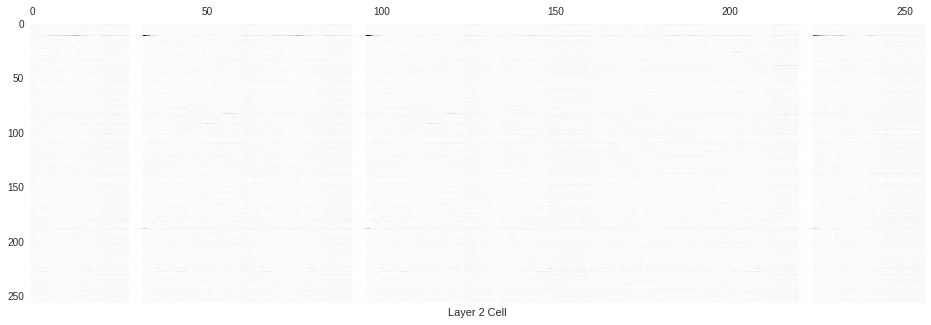

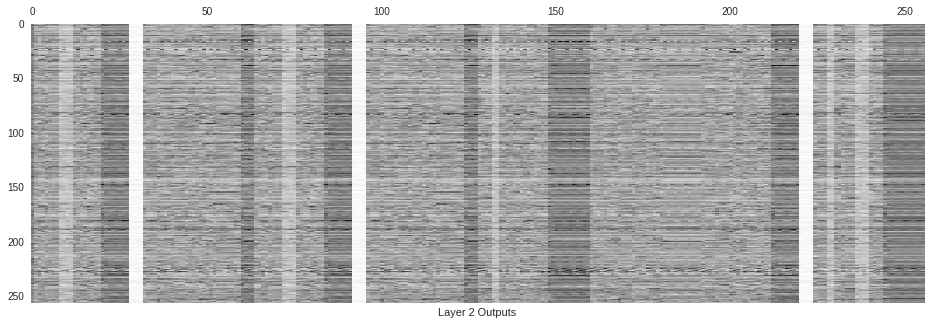

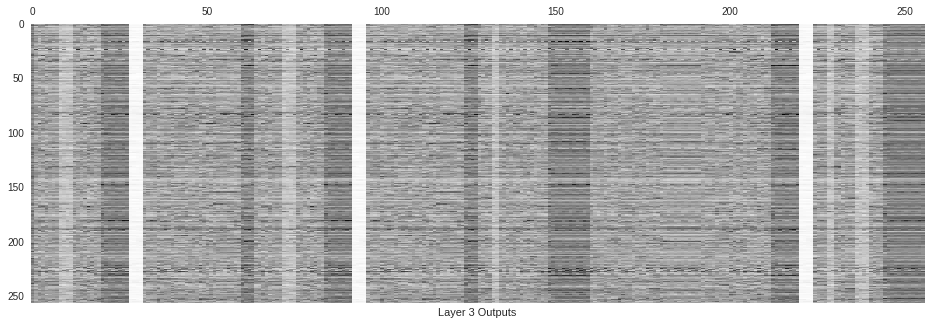

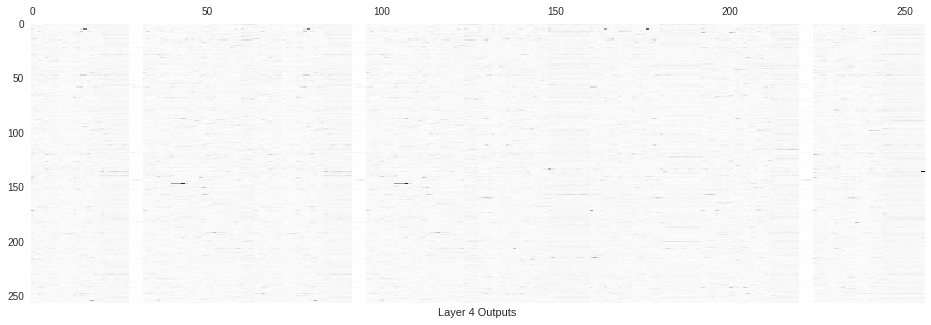

...

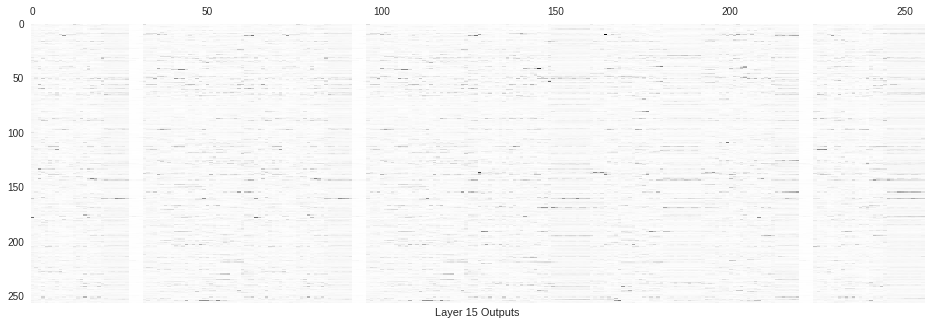

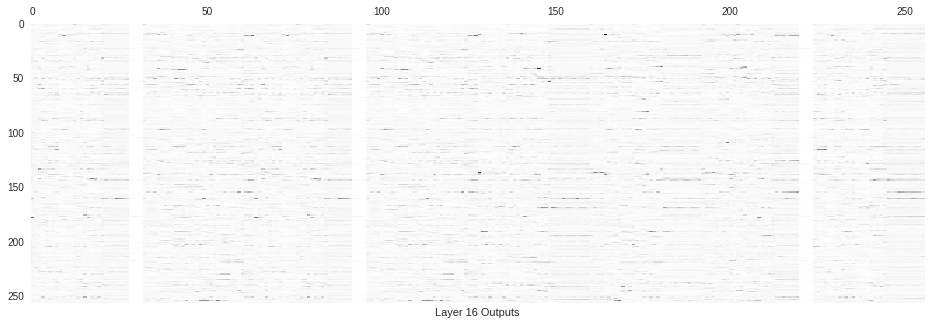

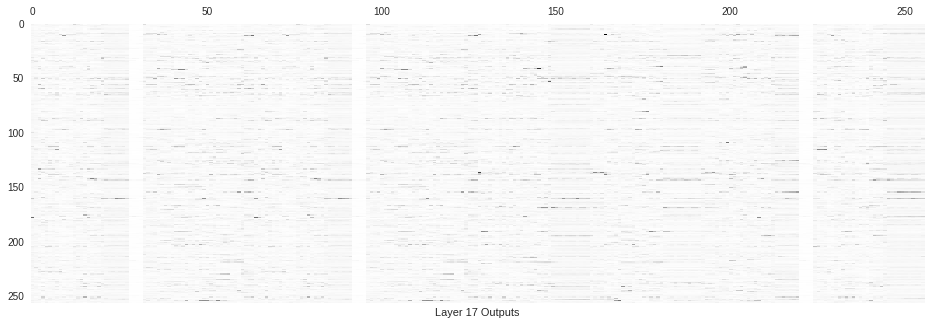

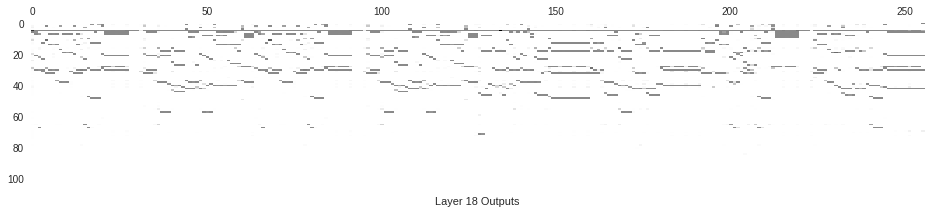

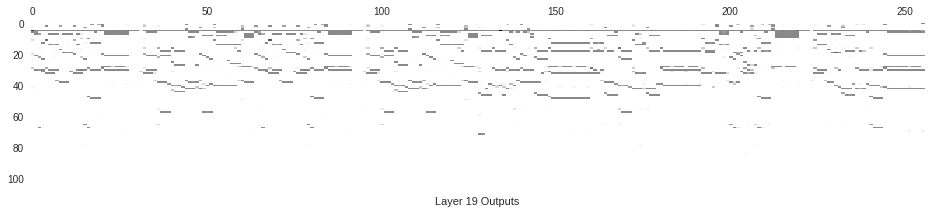

In [367]:
num_layers = 19

for layer in range(1,num_layers+1):
    fp = '/home/fl350/data/embed/outputs-{}.h5'.format(layer)
    
    cell_fp = os.path.dirname(fp) + '/cell-{}.h5'.format(layer)
    if os.path.exists(cell_fp):
        ds = h5py.File(cell_fp)[cell_fp].value.T
        ds = pool_chords(ds, is_chord_bdy, softmax_before_pool=True)
        with sns.axes_style('dark'):
            plt.figure(num=1, figsize=(16,1+np.ceil(ds.shape[0] * 4. / 300.)))
            plt.matshow(ds, fignum=1, aspect='auto')
            plt.xlabel('Layer {} Cell'.format(layer))
            plt.show()

    ds = h5py.File(fp)[fp].value.T
    ds = pool_chords(ds, is_chord_bdy, softmax_before_pool=True)
    with sns.axes_style('dark'):
        plt.figure(num=1, figsize=(16,1+np.ceil(ds.shape[0] * 4. / 300.)))
        plt.matshow(ds, fignum=1, aspect='auto')
        plt.xlabel('Layer {} Outputs'.format(layer))
        plt.show()        

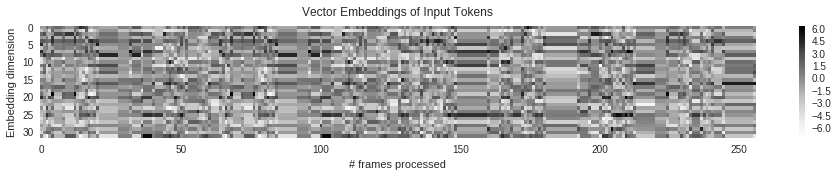

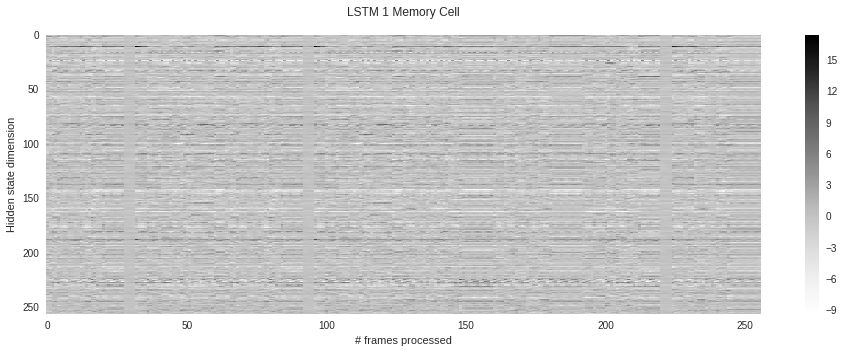

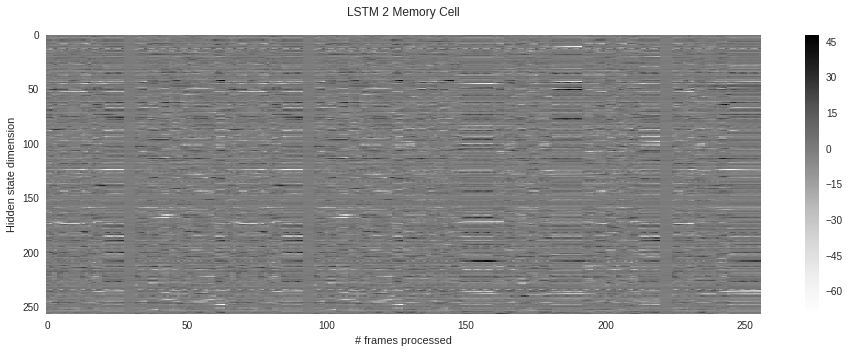

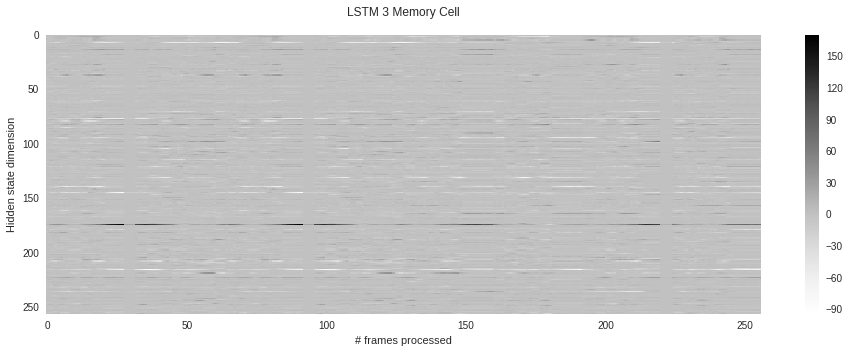

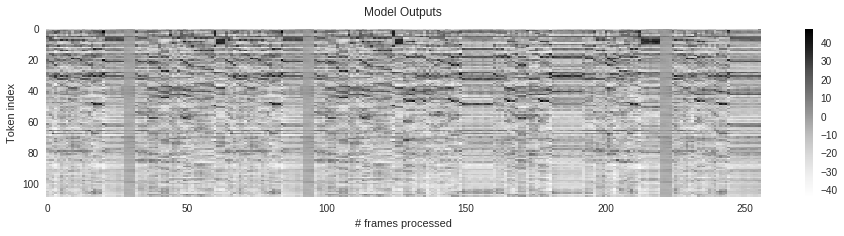

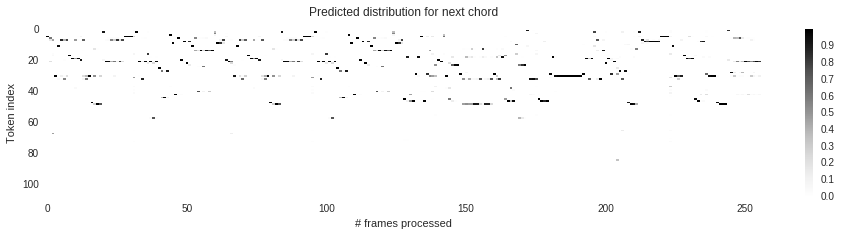

In [389]:
num_layers = len(layerNumToName)
lstm_cnt = 0
figure_cnt = 0
for layer in range(1,num_layers+1):
    fp = '/home/fl350/data/embed/outputs-{}.h5'.format(layer)
    
    cell_fp = os.path.dirname(fp) + '/cell-{}.h5'.format(layer)
    if os.path.exists(cell_fp):
        ds = h5py.File(cell_fp)[cell_fp].value.T
        ds = pool_chords(ds, is_chord_bdy, softmax_before_pool=False)
        lstm_cnt += 1
        with sns.axes_style('dark'):
            plt.figure(num=1, figsize=(16,1+np.ceil(ds.shape[0] * 4. / 300.)))
            plt.matshow(ds, fignum=1, aspect='auto')
            plt.gca().xaxis.set_ticks_position('bottom')
            plt.title('LSTM {} Memory Cell'.format(lstm_cnt))
            plt.xlabel('# frames processed')
            plt.ylabel('Hidden state dimension')
            plt.colorbar()
            plt.savefig('model-analysis-chords-{}.png'.format(figure_cnt))
            figure_cnt += 1
            plt.show()
    if layer in [1, 19]:
        ds = h5py.File(fp)[fp].value.T
        ds_pooled = pool_chords(ds, is_chord_bdy, softmax_before_pool=False)
        with sns.axes_style('dark'):
            plt.figure(num=1, figsize=(16,1+np.ceil(ds.shape[0] * 4. / 300.)))
            plt.matshow(ds_pooled, fignum=1, aspect='auto')
            plt.gca().xaxis.set_ticks_position('bottom')
            if layer == 1:
                plt.title('Vector Embeddings of Input Tokens')
                plt.ylabel('Embedding dimension')
            elif layer == 19:
                plt.title('Model Outputs')
                plt.ylabel('Token index')
            plt.xlabel('# frames processed')
            plt.colorbar()
            plt.savefig('model-analysis-chords-{}.png'.format(figure_cnt))
            figure_cnt += 1
            plt.show()
            
            if layer == 19:
                plt.figure(num=1, figsize=(16,1+np.ceil(ds.shape[0] * 4. / 300.)))
                plt.matshow(np.exp(ds_pooled) / np.sum(np.exp(ds_pooled), 0), fignum=1, aspect='auto')
                plt.gca().xaxis.set_ticks_position('bottom')
                plt.title('Predicted distribution for next chord')
                plt.xlabel('# frames processed')
                plt.ylabel('Token index')
                plt.colorbar()
                plt.savefig('model-analysis-chords-{}.png'.format(figure_cnt))
                figure_cnt += 1
                plt.show()

### Confirm that final outputs correspond to a piano roll

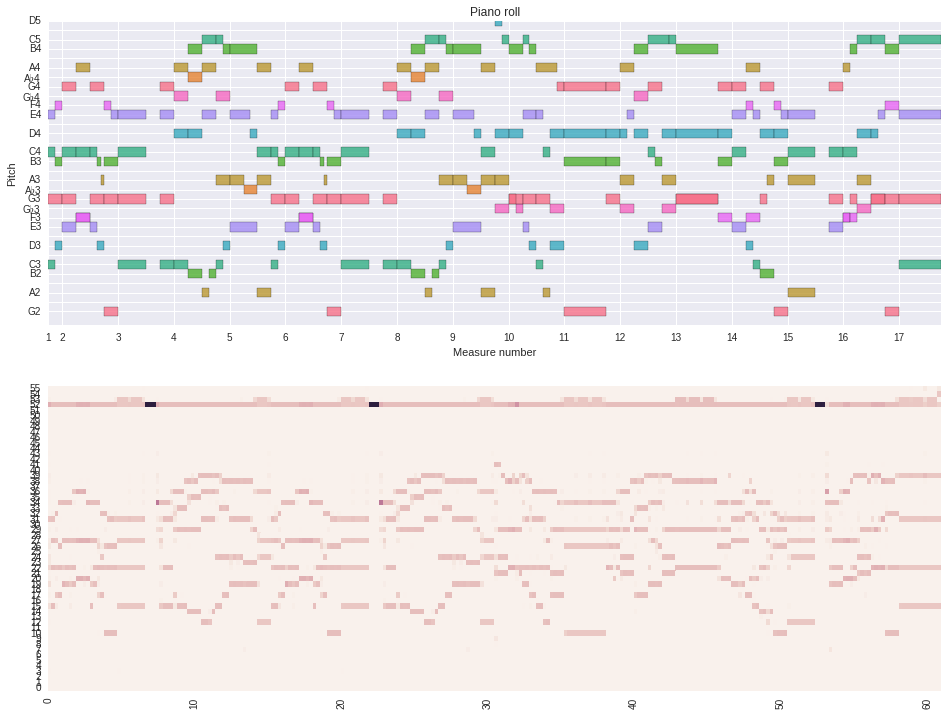

In [92]:
with sns.axes_style("darkgrid"):
    fig, (ax1, ax2) = plt.subplots(2,1)

plot_piano_roll(ax1, s)

layer = 19
fp = '/home/fl350/data/embed/outputs-{}.h5'.format(layer)
ds = h5py.File(fp)[fp].value.T


pooled_probs = pool_chords(ds, is_chord_bdy, softmax_before_pool=True)
mat_z = pool_matrix(pooled_probs[:,:], { k-1:v for k,v in idx_to_order.items() }) # combine articulated/unarticulated
mat_p = mat_z / mat_z.sum(0) # normalize
#mat_p = np.exp(mat_z) / np.exp(mat_z).sum(0)

#ax2.matshow(mat_p, aspect='auto', interpolation='none')
sns.heatmap(mat_p, ax=ax2, cbar=False)

ax2.invert_yaxis()
ax2.set_xticks(np.arange(0,mat_z.shape[1],42))
ax2.set_xticklabels(np.arange(0, mat_z.shape[1]/4, 10))
#ax2.set_title('Probabilistic piano roll predictions for next chords')

fig.set_size_inches((16,12))
fig.show()

In [67]:
_, xTicks, _ = graph.PlotHorizontalBarPitchSpaceOffset(s)._extractData()
xTicks

[[0.0, '1'],
 [1.0, '2'],
 [5.0, '3'],
 [9.0, '4'],
 [13.0, '5'],
 [17.0, '6'],
 [21.0, '7'],
 [25.0, '8'],
 [29.0, '9'],
 [33.0, '10'],
 [37.0, '11'],
 [41.0, '12'],
 [45.0, '13'],
 [49.0, '14'],
 [53.0, '15'],
 [57.0, '16'],
 [61.0, '17']]

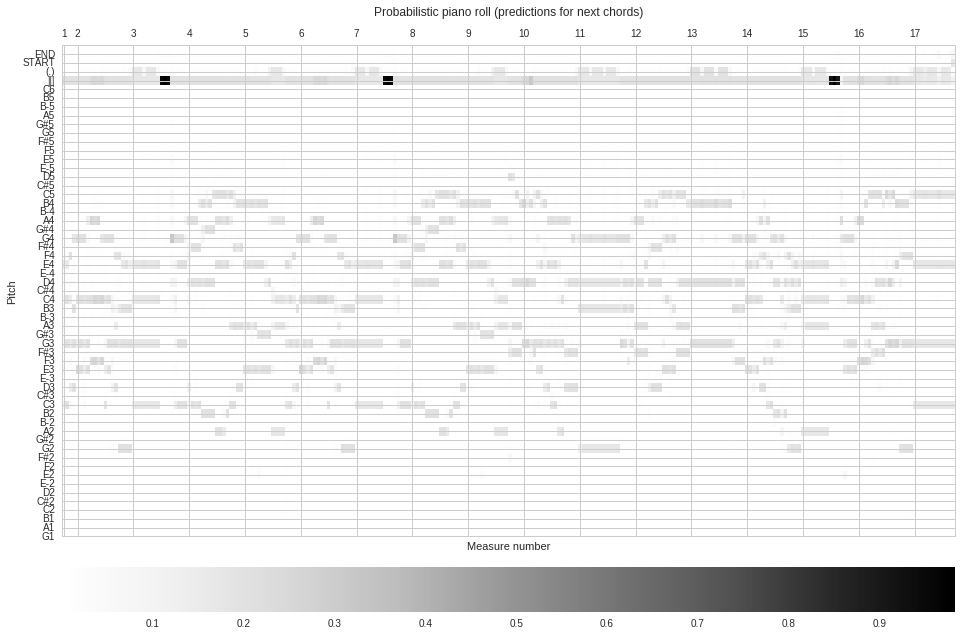

In [95]:
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,1)

layer = 19
fp = '/home/fl350/data/embed/outputs-{}.h5'.format(layer)
ds = h5py.File(fp)[fp].value.T

pooled_probs = pool_chords(ds, is_chord_bdy, softmax_before_pool=True, temperature=1.5)
mat_z = pool_matrix(pooled_probs[:,:], {k-1:v for k,v in idx_to_order.items()}) # combine articulated/unarticulated
mat_p = mat_z / mat_z.sum(0) # normalize

cax = ax.matshow(mat_p, aspect='auto', interpolation='none')
fig.colorbar(cax, orientation='horizontal', pad=0.05)
#sns.heatmap(mat_p, ax=ax, cbar=True)

ax.invert_yaxis()
#ax.set_xticks(np.arange(0,mat_z.shape[1],40))
#ax.set_xticklabels(np.arange(0, mat_z.shape[1]/4, 10))
ax.set_xticks(map(lambda x: 4*x, zip(*xTicks)[0]))
ax.set_xticklabels(zip(*xTicks)[1])
ax.set_title('Probabilistic piano roll (predictions for next chords)')
ax.set_xlabel('Measure number')
ax.set_ylabel('Pitch')
ax.set_ylim([9,len(order_to_txt)])
ax.set_yticks(map(lambda x: x, np.arange(len(order_to_txt))))
ax.set_yticklabels(map(lambda idx: order_to_txt[idx], range(len(order_to_txt))))

fig.set_size_inches((16,11))
fig.show()
fig.savefig('model-analysis-probabilistic-piano-roll.png')

## Look at neuron activations

In [96]:
def plot_neuron(ax, ds_neuron):
    ax.plot(ds_neuron)
    ax.set_xlim(xmax=ds_neuron.shape[0])
    return ax

In [97]:
def load_lstm_cell(fp, temperature=1.0):
    return pool_chords(h5py.File(fp)[fp].value.T, is_chord_bdy, softmax_before_pool=True, temperature=temperature)

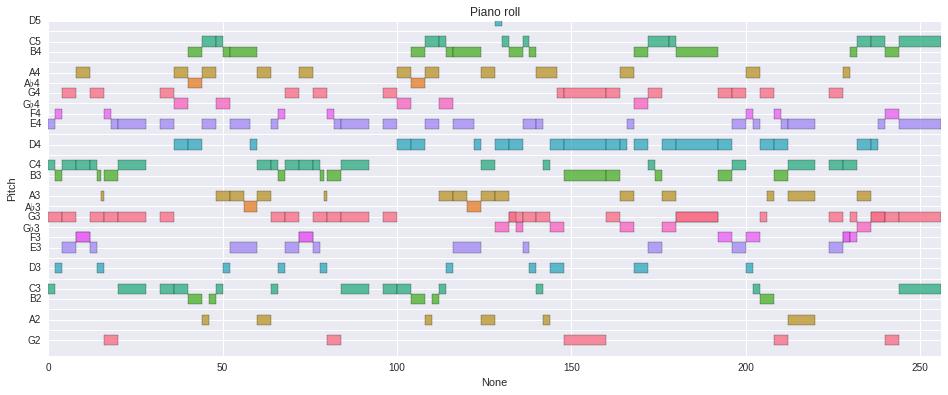

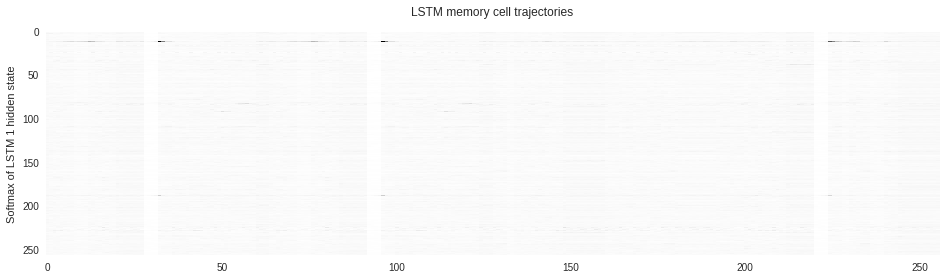

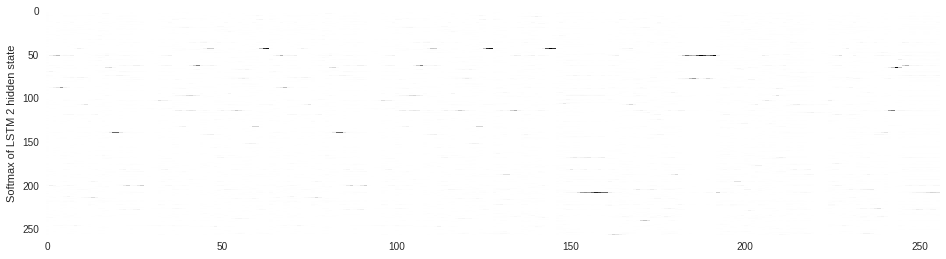

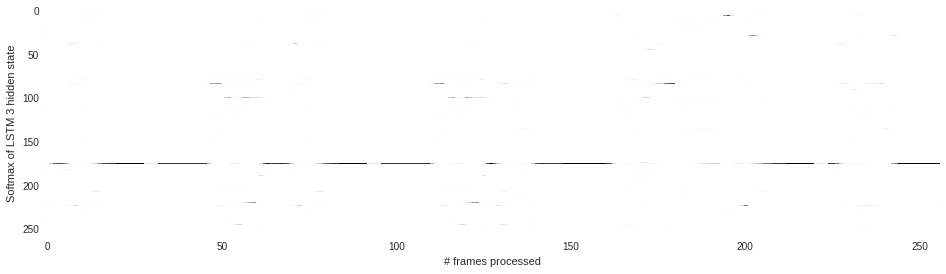

In [98]:
with sns.axes_style('darkgrid'):
    fig, ax = plt.subplots(1,1, figsize=(16,6))
    plot_piano_roll(ax, s)
    ax.set_xticks(np.arange(0,256,12.5))
    ax.set_xticklabels(np.arange(0,256,50))
    ax.set_xlim([0, 64])
    ax.set_xlabel(None)
    fig.show()
    fig.savefig('model-analysis-cells-softmax-piano-roll.png')

lstms = [
    load_lstm_cell('/home/fl350/data/embed/cell-2.h5'),
    load_lstm_cell('/home/fl350/data/embed/cell-7.h5'),
    load_lstm_cell('/home/fl350/data/embed/cell-12.h5')]

with sns.axes_style('dark'):
    for i,cell in enumerate(lstms):
        fig, ax = plt.subplots(1,1, figsize=(16,4))
        ax.matshow(cell, aspect='auto')
        ax.xaxis.set_ticks_position('bottom')
        if i == 0:
            ax.set_title('LSTM memory cell trajectories')
        if i == 2:
            ax.set_xlabel('# frames processed')
        ax.set_ylabel('Softmax of LSTM {} hidden state'.format(i+1))
        fig.show()
        fig.savefig('model-analysis-cells-softmax-{}.png'.format(i+1))

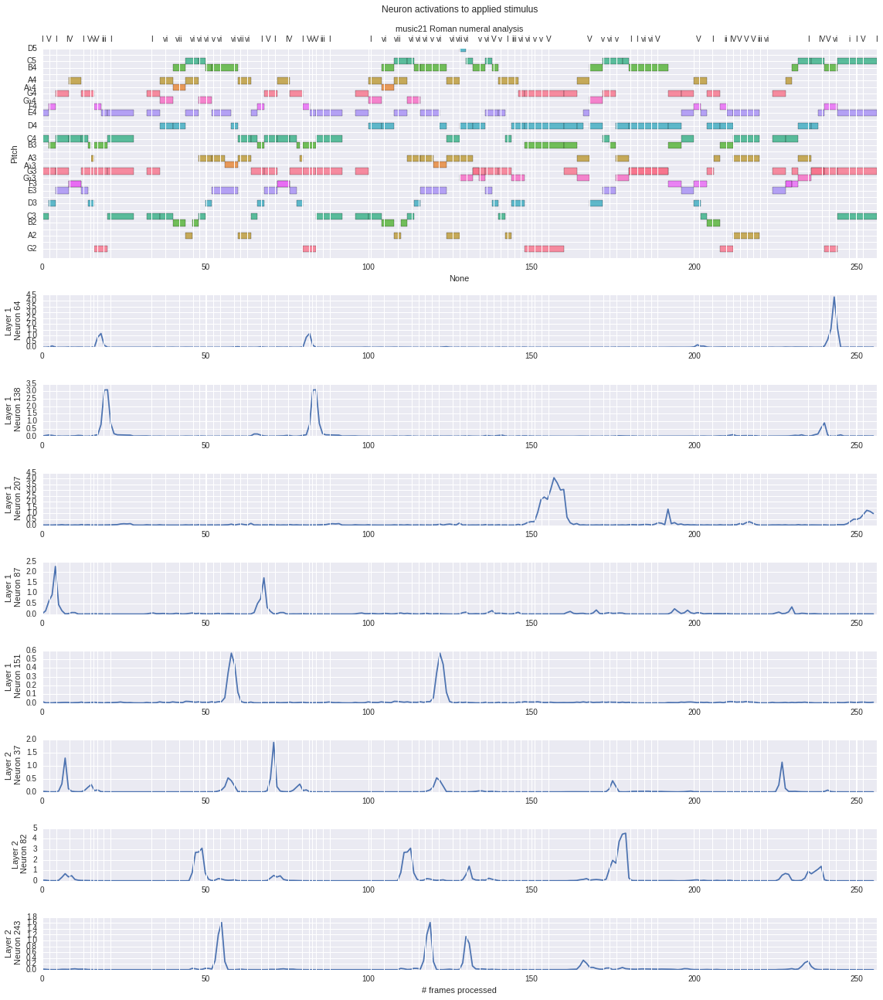

In [195]:
lstms = [
    load_lstm_cell('/home/fl350/data/embed/cell-2.h5'),
    load_lstm_cell('/home/fl350/data/embed/cell-7.h5'),
    load_lstm_cell('/home/fl350/data/embed/cell-12.h5')]

neurons = [
    (1,64), # V-I detector
    (1,138), # V-I detector
    (1,207), # V detector, inversion and duration sensitive
    (1,87), # spike on I V I, small excitation on I and V
    (1,151), # motif detector
    (2,37), # I, IV transitions
    (2,82), # chord progression peaking at vi
    (2,243),# vi, v, vi
] 


with sns.axes_style('darkgrid'):
    fig, ax = plt.subplots(1+len(neurons),1, gridspec_kw = {'height_ratios':[4] + [1]*len(neurons)})
        
    axRoman = ax[0].twiny()
    romanTicks = []
    romanLabels = []
    for roman, note in zip(sRoman.lyrics()[1], sRoman.flat.notes):
        romanTicks.append(note.offset)
        romanLabels.append(roman.text)
    axRoman.set_xticks(romanTicks)
    axRoman.set_xticklabels(romanLabels)        
    axRoman.set_xlabel('music21 Roman numeral analysis')
    
    plot_piano_roll(ax[0], s)
    ax[0].set_xticks(np.arange(0,256,12.5))
    ax[0].set_xticklabels(np.arange(0,256,50))
    ax[0].set_xlim([0, 64])
    ax[0].set_xlabel(None)
    ax[0].set_title('Neuron activations to applied stimulus\n\n\n')

for i,neuron in enumerate(neurons):
    layer, num = neuron
    plot_neuron(ax[1+i], lstms[layer][num:num+1].T)
    ax[1+i].set_ylabel('Layer {}\n Neuron {}'.format(layer, num))
    axRoman = ax[1+i].twiny()
    axRoman.set_xticks(romanTicks)
    axRoman.set_xticklabels(['']*len(romanTicks))

ax[1+i].set_xlabel('# frames processed')
    
fig.set_size_inches((16,18))
fig.tight_layout()
fig.show()
plt.savefig('model-analysis-cells-individual.png')